### Library

In [1]:
import pandas as pd
import numpy as np
import string
import xml.etree.ElementTree as ET
import nltk
import re

from nltk.corpus import stopwords, wordnet
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.metrics import classification_report

In [2]:
# Import Data
data_acd = r'C:\Users\ASUS\Documents\GitHub\Skripsi-Aspect-Category-Detection\Dataset\train.xml'

### Parsing XML

In [3]:
def parsing_xml(data):
    tree=ET.parse(data)
    root=tree.getroot()
    print(root)
    text_list=[]
    opinion_list=[]
    for review in root.findall("Review"):
        for text_string in review.findall("./sentences/sentence"):
            text_list.append(text_string.find('text').text)
        for opinion in review.findall("./sentences/sentence"):
            opinion_review=[]
            for opinion in opinion.findall('./Opinions/Opinion'):
                opini_dict = opinion.get('category')
                opinion_review.append(opini_dict)
            opinion_list.append(opini_dict)
    return text_list, opinion_list

In [4]:
data_review, train_opinion = parsing_xml(data_acd)
data_review

<Element 'Reviews' at 0x0000019976A630B0>


['Judging from previous posts this used to be a good place, but not any longer.',
 'We, there were four of us, arrived at noon - the place was empty - and the staff acted like we were imposing on them and they were very rude.',
 'They never brought us complimentary noodles, ignored repeated requests for sugar, and threw our dishes on the table.',
 'The food was lousy - too sweet or too salty and the portions tiny.',
 'After all that, they complained to me about the small tip.',
 'Avoid this place!',
 'I have eaten at Saul, many times, the food is always consistently, outrageously good.',
 'Saul is the best restaurant on Smith Street and in Brooklyn.',
 'The duck confit is always amazing and the foie gras terrine with figs was out of this world.',
 'The wine list is interesting and has many good values.',
 'For the price, you cannot eat this well in Manhattan.',
 'I was very disappointed with this restaurant.',
 'Ive asked a cart attendant for a lotus leaf wrapped rice and she replied b

In [5]:
len(data_review)

2000

In [6]:
train_opinion

['RESTAURANT#GENERAL',
 'SERVICE#GENERAL',
 'SERVICE#GENERAL',
 'FOOD#STYLE_OPTIONS',
 'SERVICE#GENERAL',
 'RESTAURANT#GENERAL',
 'FOOD#QUALITY',
 'RESTAURANT#GENERAL',
 'FOOD#QUALITY',
 'DRINKS#PRICES',
 'FOOD#QUALITY',
 'RESTAURANT#GENERAL',
 'SERVICE#GENERAL',
 'SERVICE#GENERAL',
 'FOOD#QUALITY',
 'RESTAURANT#MISCELLANEOUS',
 'RESTAURANT#GENERAL',
 'RESTAURANT#GENERAL',
 'RESTAURANT#PRICES',
 'RESTAURANT#GENERAL',
 'RESTAURANT#GENERAL',
 'AMBIENCE#GENERAL',
 'FOOD#QUALITY',
 'RESTAURANT#GENERAL',
 'RESTAURANT#GENERAL',
 'RESTAURANT#GENERAL',
 'FOOD#QUALITY',
 'FOOD#QUALITY',
 'FOOD#STYLE_OPTIONS',
 'FOOD#STYLE_OPTIONS',
 'AMBIENCE#GENERAL',
 'AMBIENCE#GENERAL',
 'AMBIENCE#GENERAL',
 'SERVICE#GENERAL',
 'FOOD#QUALITY',
 'SERVICE#GENERAL',
 'RESTAURANT#GENERAL',
 'RESTAURANT#GENERAL',
 'FOOD#QUALITY',
 'SERVICE#GENERAL',
 'AMBIENCE#GENERAL',
 'RESTAURANT#GENERAL',
 'RESTAURANT#GENERAL',
 'RESTAURANT#GENERAL',
 'FOOD#QUALITY',
 'SERVICE#GENERAL',
 'SERVICE#GENERAL',
 'SERVICE#GENERAL',

In [7]:
df = pd.DataFrame({'Review': data_review, 'Aspek': train_opinion})
df

,Review,Aspek
0,Judging from previous posts this used to be a ...,RESTAURANT#GENERAL
1,"We, there were four of us, arrived at noon - t...",SERVICE#GENERAL
2,"They never brought us complimentary noodles, i...",SERVICE#GENERAL
3,The food was lousy - too sweet or too salty an...,FOOD#STYLE_OPTIONS
4,"After all that, they complained to me about th...",SERVICE#GENERAL
...,...,...
1995,"I can't believe that it was, but please put th...",SERVICE#GENERAL
1996,The waitress came to check in on us every few ...,SERVICE#GENERAL
1997,I couldn't ignore the fact that she reach over...,SERVICE#GENERAL
1998,She then put the check down without asking if ...,SERVICE#GENERAL


In [8]:
df['Aspek'].value_counts()

Aspek
FOOD#QUALITY                564
RESTAURANT#GENERAL          462
SERVICE#GENERAL             385
AMBIENCE#GENERAL            167
RESTAURANT#MISCELLANEOUS    105
FOOD#STYLE_OPTIONS          103
RESTAURANT#PRICES            68
FOOD#PRICES                  65
DRINKS#QUALITY               28
LOCATION#GENERAL             19
DRINKS#STYLE_OPTIONS         18
DRINKS#PRICES                16
Name: count, dtype: int64

In [9]:
aspek = df.loc[:,['Aspek']]
aspek

,Aspek
0,RESTAURANT#GENERAL
1,SERVICE#GENERAL
2,SERVICE#GENERAL
3,FOOD#STYLE_OPTIONS
4,SERVICE#GENERAL
...,...
1995,SERVICE#GENERAL
1996,SERVICE#GENERAL
1997,SERVICE#GENERAL
1998,SERVICE#GENERAL


In [10]:
ulasan = df.loc[:,['Review']]
ulasan

,Review
0,Judging from previous posts this used to be a ...
1,"We, there were four of us, arrived at noon - t..."
2,"They never brought us complimentary noodles, i..."
3,The food was lousy - too sweet or too salty an...
4,"After all that, they complained to me about th..."
...,...
1995,"I can't believe that it was, but please put th..."
1996,The waitress came to check in on us every few ...
1997,I couldn't ignore the fact that she reach over...
1998,She then put the check down without asking if ...


In [11]:
ulasan.to_csv("ulasan.csv", index = None, header=True)

In [12]:
df = pd.read_csv('ulasan.csv')
df

,Review
0,Judging from previous posts this used to be a ...
1,"We, there were four of us, arrived at noon - t..."
2,"They never brought us complimentary noodles, i..."
3,The food was lousy - too sweet or too salty an...
4,"After all that, they complained to me about th..."
...,...
1995,"I can't believe that it was, but please put th..."
1996,The waitress came to check in on us every few ...
1997,I couldn't ignore the fact that she reach over...
1998,She then put the check down without asking if ...


## Text Preprocessing

### Case Folding

In [13]:
def casefolding(opinion):
    opinion = opinion.casefold()
    return opinion

### Remove Punctuation

In [14]:
def remove_punctuation(text):
    text = re.sub(r'[^\w\s]', '', text)
    return text

### Stop Word Removal

In [15]:
def stop_words(opinion):
    filteredsentence=[]
    stop_words = set(stopwords.words('english'))
    wordtokenize = word_tokenize(opinion)
    for word in wordtokenize:
        if word not in stop_words:
            filteredsentence.append(word)
    final_list=' '.join(filteredsentence)
    return final_list

### Lemmatization

In [16]:
def lemmatize_text(text):
    wnl = WordNetLemmatizer()
    tokens = word_tokenize(text)  # Tokenisasi kata
    pos_tags = nltk.pos_tag(tokens)  # Menentukan pos tag untuk setiap kata

    # Menggunakan pos tag untuk memberikan informasi yang tepat kepada lemmatizer
    lemmatized_words = []
    for token, pos in pos_tags:
        pos_tag = get_wordnet_pos(pos)
        lemmatized_word = wnl.lemmatize(token, pos=pos_tag)
        lemmatized_words.append(lemmatized_word)

    lemmatized_text = ' '.join(lemmatized_words)
    return lemmatized_text

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

### Tokenization

In [17]:
def tokenisasi(content):
    content = nltk.tokenize.word_tokenize(content)
    return content

In [18]:
df['Review'] = df['Review'].apply(casefolding)
df.head(10)

,Review
0,judging from previous posts this used to be a ...
1,"we, there were four of us, arrived at noon - t..."
2,"they never brought us complimentary noodles, i..."
3,the food was lousy - too sweet or too salty an...
4,"after all that, they complained to me about th..."
5,avoid this place!
6,"i have eaten at saul, many times, the food is ..."
7,saul is the best restaurant on smith street an...
8,the duck confit is always amazing and the foie...
9,the wine list is interesting and has many good...


In [19]:
df['Review'] = df['Review'].apply(remove_punctuation)
df.head(10)

,Review
0,judging from previous posts this used to be a ...
1,we there were four of us arrived at noon the ...
2,they never brought us complimentary noodles ig...
3,the food was lousy too sweet or too salty and...
4,after all that they complained to me about the...
5,avoid this place
6,i have eaten at saul many times the food is al...
7,saul is the best restaurant on smith street an...
8,the duck confit is always amazing and the foie...
9,the wine list is interesting and has many good...


In [20]:
df['Review'] = df['Review'].apply(lambda x: stop_words(x))
df

,Review
0,judging previous posts used good place longer
1,four us arrived noon place empty staff acted l...
2,never brought us complimentary noodles ignored...
3,food lousy sweet salty portions tiny
4,complained small tip
...,...
1995,cant believe please put bag delivering food
1996,waitress came check us every minutes began cle...
1997,couldnt ignore fact reach plate one friends mi...
1998,put check without asking done came check bill ...


In [21]:
df['Review'] = df['Review'].apply(lemmatize_text)
df

,Review
0,judge previous post use good place longer
1,four u arrive noon place empty staff act like ...
2,never bring u complimentary noodle ignore repe...
3,food lousy sweet salty portion tiny
4,complain small tip
...,...
1995,cant believe please put bag deliver food
1996,waitress come check u every minute begin clear...
1997,couldnt ignore fact reach plate one friends mi...
1998,put check without ask do come check bill every...


In [22]:
df_tokenisasi = df['Review'].apply(tokenisasi)
df_tokenisasi

0       [judge, previous, post, use, good, place, longer]
1       [four, u, arrive, noon, place, empty, staff, a...
2       [never, bring, u, complimentary, noodle, ignor...
3              [food, lousy, sweet, salty, portion, tiny]
4                                  [complain, small, tip]
                              ...                        
1995     [cant, believe, please, put, bag, deliver, food]
1996    [waitress, come, check, u, every, minute, begi...
1997    [couldnt, ignore, fact, reach, plate, one, fri...
1998    [put, check, without, ask, do, come, check, bi...
1999    [wish, could, like, place, wish, someone, woul...
Name: Review, Length: 2000, dtype: object

In [23]:
data = df.loc[:,['Review']]
data

,Review
0,judge previous post use good place longer
1,four u arrive noon place empty staff act like ...
2,never bring u complimentary noodle ignore repe...
3,food lousy sweet salty portion tiny
4,complain small tip
...,...
1995,cant believe please put bag deliver food
1996,waitress come check u every minute begin clear...
1997,couldnt ignore fact reach plate one friends mi...
1998,put check without ask do come check bill every...


## Perhitungan TF IDF

In [24]:
def Tokenize(data):
    data['review_token'] = ""
    data['Review'] = data['Review'].astype('str')
    for i in range(len(data)):
        data['review_token'][i] = data['Review'][i].lower().split()
        all_tokenize = sorted(list(set([item for sublist in data['review_token'] for item in sublist])))
    return data, all_tokenize

### Perhitungan TF

In [25]:
from operator import truediv

def hitungTF(data, all_tokenize):
    token_cal = Tokenize(data)
    data_tokenize = token_cal[0]
    for item in all_tokenize:
      data_tokenize[item] = 0
    for item in all_tokenize:
        for i in range(len(data_tokenize)):
          if data_tokenize['review_token'][i].count(item) > 0:
            a = data_tokenize['review_token'][i].count(item)
            b = len(data_tokenize['review_token'][i])
            c = a / b
            data_tokenize[item] = data_tokenize[item].astype('float')
            data_tokenize[item][i] = c
    return data_tokenize

In [26]:
hitungTF(data, Tokenize(data)[1])

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2501605007.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_tokenize[item] = 0
C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2501605007.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_tokenize[item] = 0
C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2501605007.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.con

,Review,review_token,0,1,10,100,1015,10piece,11,12,...,yuka,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero
0,judge previous post use good place longer,"[judge, previous, post, use, good, place, longer]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,four u arrive noon place empty staff act like ...,"[four, u, arrive, noon, place, empty, staff, a...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,never bring u complimentary noodle ignore repe...,"[never, bring, u, complimentary, noodle, ignor...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,food lousy sweet salty portion tiny,"[food, lousy, sweet, salty, portion, tiny]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,complain small tip,"[complain, small, tip]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,cant believe please put bag deliver food,"[cant, believe, please, put, bag, deliver, food]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1996,waitress come check u every minute begin clear...,"[waitress, come, check, u, every, minute, begi...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1997,couldnt ignore fact reach plate one friends mi...,"[couldnt, ignore, fact, reach, plate, one, fri...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,put check without ask do come check bill every...,"[put, check, without, ask, do, come, check, bi...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Perhitungan IDF

In [27]:
def hitungIDF(data):
    N = len(data)
    all_tokenize = Tokenize(data)[1]
    _idf = hitungTF(data, all_tokenize)
    for item in all_tokenize:
        df_ = (_idf[item] > 0).sum()
        idf = (np.log(N / df_))
        _idf[item] = idf
    return _idf

In [28]:
df_idf = hitungIDF(data)
df_idf

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2939030479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['review_token'][i] = data['Review'][i].lower().split()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2939030479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['review_token'][i] = data['Review'][i].lower().split()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2939030479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view

,Review,review_token,0,1,10,100,1015,10piece,11,12,...,yuka,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero
0,judge previous post use good place longer,"[judge, previous, post, use, good, place, longer]",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
1,four u arrive noon place empty staff act like ...,"[four, u, arrive, noon, place, empty, staff, a...",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
2,never bring u complimentary noodle ignore repe...,"[never, bring, u, complimentary, noodle, ignor...",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
3,food lousy sweet salty portion tiny,"[food, lousy, sweet, salty, portion, tiny]",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
4,complain small tip,"[complain, small, tip]",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,cant believe please put bag deliver food,"[cant, believe, please, put, bag, deliver, food]",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
1996,waitress come check u every minute begin clear...,"[waitress, come, check, u, every, minute, begi...",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
1997,couldnt ignore fact reach plate one friends mi...,"[couldnt, ignore, fact, reach, plate, one, fri...",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902
1998,put check without ask do come check bill every...,"[put, check, without, ask, do, come, check, bi...",7.600902,5.991465,5.654992,6.214608,7.600902,7.600902,7.600902,5.991465,...,6.907755,7.600902,7.600902,5.654992,7.600902,7.600902,7.600902,7.600902,7.600902,7.600902


### Perhitungan TFIDF

In [29]:
def hitungTFIDF(data):
    N = len(data)
    all_tokenize = Tokenize(data)[1]
    tf_idf = hitungTF(data, all_tokenize)
    for item in all_tokenize:
        df_ = (tf_idf[item] > 0).sum()
        idf = (np.log(N / df_))
        tf_idf[item] = tf_idf[item] * idf
    return tf_idf

In [30]:
df_tf_idf = hitungTFIDF(data)
df_tf_idf

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2939030479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['review_token'][i] = data['Review'][i].lower().split()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2939030479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['review_token'][i] = data['Review'][i].lower().split()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\2939030479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view

,Review,review_token,0,1,10,100,1015,10piece,11,12,...,yuka,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero
0,judge previous post use good place longer,"[judge, previous, post, use, good, place, longer]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,four u arrive noon place empty staff act like ...,"[four, u, arrive, noon, place, empty, staff, a...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,never bring u complimentary noodle ignore repe...,"[never, bring, u, complimentary, noodle, ignor...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,food lousy sweet salty portion tiny,"[food, lousy, sweet, salty, portion, tiny]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,complain small tip,"[complain, small, tip]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,cant believe please put bag deliver food,"[cant, believe, please, put, bag, deliver, food]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1996,waitress come check u every minute begin clear...,"[waitress, come, check, u, every, minute, begi...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1997,couldnt ignore fact reach plate one friends mi...,"[couldnt, ignore, fact, reach, plate, one, fri...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,put check without ask do come check bill every...,"[put, check, without, ask, do, come, check, bi...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [31]:
tf_idf_data = df_tf_idf.drop(columns=['Review', 'review_token'], axis=1)
tf_idf_data

,0,1,10,100,1015,10piece,11,12,120,126,...,yuka,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
tf_idf_data['Dokumen'] = [f'Dokumen{i+1}' for i in range(len(data["Review"]))]
tf_idf_data

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25400\1936574750.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tf_idf_data['Dokumen'] = [f'Dokumen{i+1}' for i in range(len(data["Review"]))]


,0,1,10,100,1015,10piece,11,12,120,126,...,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero,Dokumen
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen2
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen3
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen4
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1996
1996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1997
1997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1998
1998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1999


In [33]:
aspek 

,Aspek
0,RESTAURANT#GENERAL
1,SERVICE#GENERAL
2,SERVICE#GENERAL
3,FOOD#STYLE_OPTIONS
4,SERVICE#GENERAL
...,...
1995,SERVICE#GENERAL
1996,SERVICE#GENERAL
1997,SERVICE#GENERAL
1998,SERVICE#GENERAL


In [34]:
aspek['Dokumen'] = [f'Dokumen{i+1}' for i in range(len(aspek["Aspek"]))]
aspek

,Aspek,Dokumen
0,RESTAURANT#GENERAL,Dokumen1
1,SERVICE#GENERAL,Dokumen2
2,SERVICE#GENERAL,Dokumen3
3,FOOD#STYLE_OPTIONS,Dokumen4
4,SERVICE#GENERAL,Dokumen5
...,...,...
1995,SERVICE#GENERAL,Dokumen1996
1996,SERVICE#GENERAL,Dokumen1997
1997,SERVICE#GENERAL,Dokumen1998
1998,SERVICE#GENERAL,Dokumen1999


In [35]:
tf_idf_aspek = tf_idf_data.merge(aspek, on='Dokumen')
tf_idf_aspek

,0,1,10,100,1015,10piece,11,12,120,126,...,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero,Dokumen,Aspek
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1,RESTAURANT#GENERAL
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen2,SERVICE#GENERAL
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen3,SERVICE#GENERAL
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen4,FOOD#STYLE_OPTIONS
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen5,SERVICE#GENERAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1996,SERVICE#GENERAL
1996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1997,SERVICE#GENERAL
1997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1998,SERVICE#GENERAL
1998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dokumen1999,SERVICE#GENERAL


In [36]:
tf_idf_aspek.drop('Dokumen', axis=1, inplace=True)
tf_idf_aspek

,0,1,10,100,1015,10piece,11,12,120,126,...,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero,Aspek
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RESTAURANT#GENERAL
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FOOD#STYLE_OPTIONS
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
1996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
1997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
1998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL


In [37]:
from sklearn.model_selection import train_test_split

data_latih_aspek,data_uji_aspek = train_test_split(tf_idf_aspek, test_size = 0.2, random_state = 26)
print(data_uji_aspek.shape[0])
print(data_latih_aspek.shape[0])

400
1600


In [38]:
data_uji_aspek['Aspek'].value_counts()

Aspek
FOOD#QUALITY                112
RESTAURANT#GENERAL           96
SERVICE#GENERAL              78
AMBIENCE#GENERAL             34
RESTAURANT#MISCELLANEOUS     19
RESTAURANT#PRICES            18
FOOD#STYLE_OPTIONS           17
FOOD#PRICES                  13
DRINKS#QUALITY                5
DRINKS#PRICES                 5
DRINKS#STYLE_OPTIONS          3
Name: count, dtype: int64

In [39]:
data_latih_aspek['Aspek'].value_counts()

Aspek
FOOD#QUALITY                452
RESTAURANT#GENERAL          366
SERVICE#GENERAL             307
AMBIENCE#GENERAL            133
FOOD#STYLE_OPTIONS           86
RESTAURANT#MISCELLANEOUS     86
FOOD#PRICES                  52
RESTAURANT#PRICES            50
DRINKS#QUALITY               23
LOCATION#GENERAL             19
DRINKS#STYLE_OPTIONS         15
DRINKS#PRICES                11
Name: count, dtype: int64

In [40]:
data_latih_aspek

,0,1,10,100,1015,10piece,11,12,120,126,...,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero,Aspek
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RESTAURANT#GENERAL
1294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RESTAURANT#GENERAL
961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,AMBIENCE#GENERAL
1993,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
1862,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
1456,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RESTAURANT#MISCELLANEOUS
1798,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
1342,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FOOD#QUALITY


In [41]:
data_uji_aspek

,0,1,10,100,1015,10piece,11,12,120,126,...,yukon,yum,yummy,yuzu,zabars,zen,zenkichi,zero,zucchero,Aspek
1429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DRINKS#QUALITY
520,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RESTAURANT#GENERAL
770,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FOOD#QUALITY
1552,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
1516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RESTAURANT#GENERAL
111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SERVICE#GENERAL
185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FOOD#QUALITY
1767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FOOD#STYLE_OPTIONS


In [42]:
label_uji_aspek = data_uji_aspek.pop('Aspek')
label_uji_aspek

1429        DRINKS#QUALITY
520     RESTAURANT#GENERAL
770           FOOD#QUALITY
1552       SERVICE#GENERAL
1516       SERVICE#GENERAL
               ...        
1465    RESTAURANT#GENERAL
111        SERVICE#GENERAL
185           FOOD#QUALITY
1767    FOOD#STYLE_OPTIONS
1090    RESTAURANT#GENERAL
Name: Aspek, Length: 400, dtype: object

## Klasifikasi Support Vector Machine

### Buat Training Dataset

In [43]:
def buat_trainingset_aspek(dataset_aspek):
    trainingset_aspek = {}
    kolom_kelas_aspek = dataset_aspek.columns[-1]
    list_kelas_aspek = dataset_aspek[kolom_kelas_aspek].unique()
    for kelas_aspek in list_kelas_aspek:
        data_temp_aspek = dataset_aspek.copy(deep=True)
        data_temp_aspek[kolom_kelas_aspek] = data_temp_aspek[kolom_kelas_aspek].map({kelas_aspek:1})
        data_temp_aspek[kolom_kelas_aspek] = data_temp_aspek[kolom_kelas_aspek].fillna(-1)
        trainingset_aspek[kelas_aspek] = data_temp_aspek
    return trainingset_aspek

In [44]:
trainingset_aspek = buat_trainingset_aspek(data_latih_aspek)
trainingset_aspek

{'RESTAURANT#GENERAL':         0    1   10  100  1015  10piece   11   12  120  126  ...  yukon  yum   
 1495  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0  \
 1294  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 961   0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 1993  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 1862  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 ...   ...  ...  ...  ...   ...      ...  ...  ...  ...  ...  ...    ...  ...   
 1985  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 1456  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 1798  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 1342  0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 821   0.0  0.0  0.0  0.0   0.0      0.0  0.0  0.0  0.0  0.0  ...    0.0  0.0   
 
    

### Menghitung Hingeloss

In [45]:
def hinge_loss_function_aspek(W_aspek, X_aspek, Y_aspek, regularization_aspek):
    jarak_aspek = 1 - (Y_aspek * np.dot(X_aspek, W_aspek))
    dw_aspek = np.zeros(len(W_aspek)) ##mengisi semua nilai dengan 0
    if max(0, jarak_aspek) == 0: ##fungsi max mengembalikan item dengan niai tertinggi dalam iterable
      di_aspek = W_aspek
    else:
      di_aspek = W_aspek - (regularization_aspek * Y_aspek * X_aspek)
    dw_aspek += di_aspek
    return dw_aspek

### Menghitung Perubahan Bobot

In [46]:
from sklearn.utils import shuffle

def sgd_aspek(data_latih_aspek, label_latih_aspek, learning_rate_aspek, max_epoch_aspek, regularization_aspek):
    learning_rate_aspek = learning_rate_aspek
    max_epoch_aspek = max_epoch_aspek
    regularization_aspek = regularization_aspek
    data_latih_aspek = data_latih_aspek.to_numpy() ##mengubah data latih menjadi array numpy
    label_latih_aspek = label_latih_aspek.to_numpy()
    bobot_aspek = np.zeros(data_latih_aspek.shape[1]) ##data_latih.shape[1] = memberikan jumlah kolom (Gives number of columns). mengubah semua kolom dengan nilai 0 setelah mengetahui jumlah kolomnya
    for epoch_aspek in range(1, max_epoch_aspek+1):
      X_aspek,Y_aspek = shuffle(data_latih_aspek, label_latih_aspek, random_state=101)
      for index_aspek,x_aspek in enumerate(X_aspek):
        costgradient_aspek = hinge_loss_function_aspek(bobot_aspek, x_aspek, Y_aspek[index_aspek], regularization_aspek) #perhitungan nilai gradient cost function
        bobot_aspek = bobot_aspek - (learning_rate_aspek * costgradient_aspek)
    return bobot_aspek

In [47]:
learning_rate_aspek = 0.00001
max_epoch_aspek=100
regularization_aspek = 1000

### Training Model

In [48]:
def training_aspek(trainingset_aspek):
    list_kelas_aspek = trainingset_aspek.keys() ##mengembalikan berisi kunci kamus sbg daftar dari trainingset
    w_aspek = {}
    for kelas_aspek in list_kelas_aspek:
      data_latih_aspek = trainingset_aspek[kelas_aspek]
      label_latih_aspek = data_latih_aspek.pop(data_latih_aspek.columns[-1]) ##diambil kolom terakhir
      w_aspek[kelas_aspek] = sgd_aspek(data_latih_aspek, label_latih_aspek, learning_rate_aspek, max_epoch_aspek, regularization_aspek)
    return w_aspek

In [49]:
W_aspek = training_aspek(trainingset_aspek)
W_aspek

{'RESTAURANT#GENERAL': array([ 0.04696593,  0.3609829 ,  0.2808998 , ..., -0.29158123,
        -0.1492553 ,  0.31667035]),
 'AMBIENCE#GENERAL': array([-0.08616398, -0.26586401, -0.26508538, ...,  0.29158123,
         0.03244528, -0.10145574]),
 'SERVICE#GENERAL': array([-0.00523462, -0.10723571, -0.27420502, ..., -0.15561585,
        -0.09882947, -0.00667195]),
 'FOOD#QUALITY': array([-0.10698303, -0.44892594, -0.20612976, ..., -0.00614334,
        -0.08753496, -0.18012517]),
 'FOOD#STYLE_OPTIONS': array([-0.00523462, -0.31013249, -0.24303807, ..., -0.01922687,
        -0.11920758, -0.04799627]),
 'DRINKS#QUALITY': array([-0.00523462, -0.09321811, -0.20053383, ..., -0.00487504,
        -0.11071455, -0.01751466]),
 'RESTAURANT#MISCELLANEOUS': array([-0.00523462, -0.1625551 , -0.20407261, ..., -0.10524988,
        -0.13985031, -0.08634024]),
 'LOCATION#GENERAL': array([-0.00523462, -0.21800108, -0.21198334, ..., -0.00614334,
        -0.10204448, -0.02334904]),
 'DRINKS#STYLE_OPTIONS': ar

### Testing Model

In [50]:
def testing_aspek(W_aspek, data_uji_aspek):
    prediksi_aspek = np.array([])
    for i in range(data_uji_aspek.shape[0]): ##data_uji_aspek.shape[0] = memberikan jumlah baris (Gives number of rows)
      y_prediksi_aspek = np.sign(np.dot(W_aspek, data_uji_aspek.to_numpy()[i]))
      prediksi_aspek = np.append(prediksi_aspek, y_prediksi_aspek) ##Tambahkan nilai ke akhir array.
    return prediksi_aspek

In [51]:
def testing_onevsrest_aspek(W_aspek,data_uji_aspek):
    list_kelas_aspek = W_aspek.keys() ##mengembalikan berisi kunci kamus sbg daftar dari w/bobot
    hasil_aspek = pd.DataFrame(columns = W_aspek.keys())
    for kelas_aspek in list_kelas_aspek:
      hasil_aspek[kelas_aspek] = testing_aspek(W_aspek[kelas_aspek], data_uji_aspek)
    kelas_prediksi_aspek = hasil_aspek.idxmax(1) ##Mengembalikan nama kolom yang memiliki nilai terbesar pada setiap baris
    return kelas_prediksi_aspek

In [52]:
prediksi_aspek = testing_onevsrest_aspek(W_aspek, data_uji_aspek)
prediksi_aspek

0      RESTAURANT#GENERAL
1      RESTAURANT#GENERAL
2            FOOD#QUALITY
3      RESTAURANT#GENERAL
4      RESTAURANT#GENERAL
              ...        
395    RESTAURANT#GENERAL
396    RESTAURANT#GENERAL
397          FOOD#QUALITY
398    RESTAURANT#GENERAL
399    RESTAURANT#GENERAL
Length: 400, dtype: object

### Hasil Evaluasi

In [53]:
from sklearn.metrics import classification_report

print(classification_report(label_uji_aspek, prediksi_aspek))

                          precision    recall  f1-score   support

        AMBIENCE#GENERAL       0.75      0.26      0.39        34
           DRINKS#PRICES       0.00      0.00      0.00         5
          DRINKS#QUALITY       0.00      0.00      0.00         5
    DRINKS#STYLE_OPTIONS       1.00      0.33      0.50         3
             FOOD#PRICES       1.00      0.08      0.14        13
            FOOD#QUALITY       0.70      0.52      0.59       112
      FOOD#STYLE_OPTIONS       0.50      0.24      0.32        17
      RESTAURANT#GENERAL       0.35      0.82      0.50        96
RESTAURANT#MISCELLANEOUS       0.50      0.05      0.10        19
       RESTAURANT#PRICES       0.83      0.28      0.42        18
         SERVICE#GENERAL       0.62      0.50      0.55        78

                accuracy                           0.49       400
               macro avg       0.57      0.28      0.32       400
            weighted avg       0.59      0.49      0.47       400



C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1344: U

In [54]:
label_aktual = pd.DataFrame({'Actual' : label_uji_aspek})
label_aktual

,Actual
1429,DRINKS#QUALITY
520,RESTAURANT#GENERAL
770,FOOD#QUALITY
1552,SERVICE#GENERAL
1516,SERVICE#GENERAL
...,...
1465,RESTAURANT#GENERAL
111,SERVICE#GENERAL
185,FOOD#QUALITY
1767,FOOD#STYLE_OPTIONS


In [55]:
label_prediksi = pd.DataFrame({'Predicted' : prediksi_aspek})
label_prediksi

,Predicted
0,RESTAURANT#GENERAL
1,RESTAURANT#GENERAL
2,FOOD#QUALITY
3,RESTAURANT#GENERAL
4,RESTAURANT#GENERAL
...,...
395,RESTAURANT#GENERAL
396,RESTAURANT#GENERAL
397,FOOD#QUALITY
398,RESTAURANT#GENERAL


In [56]:
label_aktual['Dokumen'] = [f'Dokumen{i+1}' for i in range(len(label_aktual["Actual"]))]
label_aktual

,Actual,Dokumen
1429,DRINKS#QUALITY,Dokumen1
520,RESTAURANT#GENERAL,Dokumen2
770,FOOD#QUALITY,Dokumen3
1552,SERVICE#GENERAL,Dokumen4
1516,SERVICE#GENERAL,Dokumen5
...,...,...
1465,RESTAURANT#GENERAL,Dokumen396
111,SERVICE#GENERAL,Dokumen397
185,FOOD#QUALITY,Dokumen398
1767,FOOD#STYLE_OPTIONS,Dokumen399


In [57]:
label_prediksi['Dokumen'] = [f'Dokumen{i+1}' for i in range(len(label_prediksi["Predicted"]))]
label_prediksi

,Predicted,Dokumen
0,RESTAURANT#GENERAL,Dokumen1
1,RESTAURANT#GENERAL,Dokumen2
2,FOOD#QUALITY,Dokumen3
3,RESTAURANT#GENERAL,Dokumen4
4,RESTAURANT#GENERAL,Dokumen5
...,...,...
395,RESTAURANT#GENERAL,Dokumen396
396,RESTAURANT#GENERAL,Dokumen397
397,FOOD#QUALITY,Dokumen398
398,RESTAURANT#GENERAL,Dokumen399


In [58]:
aktual_prediksi = label_aktual.merge(label_prediksi, on='Dokumen')
aktual_prediksi

,Actual,Dokumen,Predicted
0,DRINKS#QUALITY,Dokumen1,RESTAURANT#GENERAL
1,RESTAURANT#GENERAL,Dokumen2,RESTAURANT#GENERAL
2,FOOD#QUALITY,Dokumen3,FOOD#QUALITY
3,SERVICE#GENERAL,Dokumen4,RESTAURANT#GENERAL
4,SERVICE#GENERAL,Dokumen5,RESTAURANT#GENERAL
...,...,...,...
395,RESTAURANT#GENERAL,Dokumen396,RESTAURANT#GENERAL
396,SERVICE#GENERAL,Dokumen397,RESTAURANT#GENERAL
397,FOOD#QUALITY,Dokumen398,FOOD#QUALITY
398,FOOD#STYLE_OPTIONS,Dokumen399,RESTAURANT#GENERAL


In [59]:
aktual_prediksi.drop('Dokumen', axis=1, inplace=True)
aktual_prediksi

,Actual,Predicted
0,DRINKS#QUALITY,RESTAURANT#GENERAL
1,RESTAURANT#GENERAL,RESTAURANT#GENERAL
2,FOOD#QUALITY,FOOD#QUALITY
3,SERVICE#GENERAL,RESTAURANT#GENERAL
4,SERVICE#GENERAL,RESTAURANT#GENERAL
...,...,...
395,RESTAURANT#GENERAL,RESTAURANT#GENERAL
396,SERVICE#GENERAL,RESTAURANT#GENERAL
397,FOOD#QUALITY,FOOD#QUALITY
398,FOOD#STYLE_OPTIONS,RESTAURANT#GENERAL


### Confusion Matrix

In [60]:
from sklearn.metrics import confusion_matrix

matrix = confusion_matrix(label_uji_aspek, prediksi_aspek)
matrix

array([[ 9,  0,  0,  0,  0,  2,  0, 19,  0,  0,  4],
       [ 0,  0,  0,  0,  0,  1,  0,  3,  0,  0,  1],
       [ 0,  0,  0,  0,  0,  1,  0,  3,  0,  0,  1],
       [ 0,  0,  1,  1,  0,  0,  0,  1,  0,  0,  0],
       [ 1,  0,  0,  0,  1,  5,  1,  5,  0,  0,  0],
       [ 1,  0,  0,  0,  0, 58,  1, 44,  0,  1,  7],
       [ 0,  0,  0,  0,  0,  4,  4,  9,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  8,  1, 79,  1,  0,  7],
       [ 0,  0,  0,  0,  0,  0,  0, 16,  1,  0,  2],
       [ 0,  0,  0,  0,  0,  1,  0, 10,  0,  5,  2],
       [ 1,  0,  0,  0,  0,  3,  1, 34,  0,  0, 39]], dtype=int64)

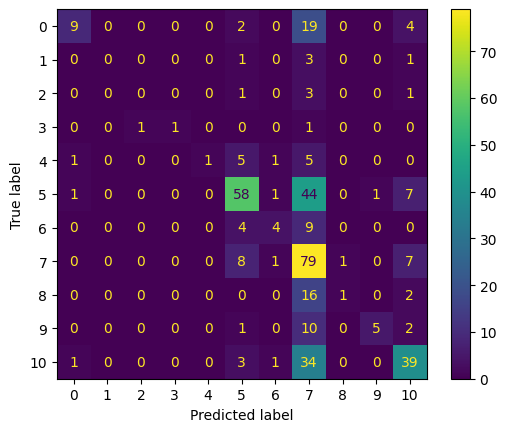

In [61]:
from sklearn import metrics
import matplotlib.pyplot as plt

cm_SGD = metrics.confusion_matrix(label_uji_aspek, prediksi_aspek)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm_SGD)
cm_display.plot()
plt.show()

In [62]:
from sklearn.metrics import precision_score

print(precision_score(label_uji_aspek, prediksi_aspek, average='macro'))

0.5686760202536312


C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [63]:
from sklearn.metrics import recall_score

print(recall_score(label_uji_aspek, prediksi_aspek, average='macro'))

0.2801308705913969


In [64]:
from sklearn.metrics import f1_score
print(f1_score(label_uji_aspek, prediksi_aspek, average='macro'))

0.31903884931492016


In [65]:
from sklearn.metrics import accuracy_score
print(accuracy_score(label_uji_aspek, prediksi_aspek))

0.4925


### Percobaan Parameter

In [66]:
# from sklearn.metrics import accuracy_score

# Cs = [1, 10, 100, 1000, 10000]
# etas = [0.00001, 0.0001, 0.001, 0.01, 0.1]

# best_C, best_eta = None, None
# best_accuracy = 0
# max_epoch_aspek = 100

# for regularization_aspek in Cs:
#     print(regularization_aspek)
#     for learning_rate_aspek in etas:
#       print(learning_rate_aspek)
#       trainingset_aspek = buat_trainingset_aspek(data_latih_aspek)
#       W_aspek = training_aspek(trainingset_aspek)
#       prediksi_aspek = testing_onevsrest_aspek(W_aspek,data_uji_aspek)

#       accuracy = accuracy_score(label_uji_aspek, prediksi_aspek)
#       print(accuracy)
#       print()

#       if accuracy > best_accuracy:
#         best_C = regularization_aspek
#         best_eta = learning_rate_aspek
#         best_accuracy = accuracy

# print('Best C:', best_C)
# print('Best lr:', best_eta)
# print('Best accuracy:', best_accuracy)

### Streamlit

In [67]:
import pickle

pickle.dump(W_aspek, open('deteksikategoriaspek_model.sav', 'wb'))
pickle.dump(tf_idf_data, open('tf_idf_data.sav', 'wb'))
pickle.dump(data, open('data.sav', 'wb'))